In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

print('numpy version : ',np.__version__)
print('pandas version : ',pd.__version__)
print('seaborn version : ',sns.__version__)

#statistics tools
import statsmodels.api as sm
import scipy.stats as st
from scipy.stats import shapiro, mannwhitneyu, chi2_contingency

#scikit learn framework
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn.naive_bayes import GaussianNB

import warnings
warnings.filterwarnings('ignore')

numpy version :  1.26.4
pandas version :  2.2.2
seaborn version :  0.13.2


In [2]:
sns.set(rc={'figure.figsize':(20.7,8.27)})
sns.set_style("whitegrid")
sns.color_palette("dark")
plt.style.use("fivethirtyeight")

# Load and Describe Data

# Load Data

In [7]:
df = pd.read_csv('dataset.csv')

In [9]:
df.sample(20)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
634,0.0,0.000000,0,0.0,7,383.500000,0.000000,0.023810,0.000000,0.0,Mar,3.0,2,6,3,Returning_Visitor,False,False
11031,2.0,84.500000,0,0.0,21,710.541667,0.012121,0.028788,0.000000,0.0,Nov,2.0,4,4,2,Returning_Visitor,False,False
1651,0.0,0.000000,0,0.0,16,1533.000000,0.000000,0.006250,0.000000,0.0,Mar,2.0,2,7,1,Returning_Visitor,False,False
7585,1.0,45.400000,0,0.0,41,1227.713333,0.019512,0.041057,0.000000,0.0,Oct,1.0,1,3,3,Returning_Visitor,False,False
7336,1.0,6.000000,0,0.0,27,1496.466667,0.046914,0.069982,7.468469,0.0,Jul,3.0,2,3,1,Returning_Visitor,True,False
272,1.0,28.000000,1,47.0,13,224.500000,0.000000,0.014286,0.000000,0.0,Mar,1.0,1,1,8,New_Visitor,False,False
9357,0.0,0.000000,0,0.0,24,3181.500000,0.002778,0.027083,0.000000,0.0,Nov,2.0,2,1,13,Returning_Visitor,True,False
8585,11.0,194.575000,0,0.0,81,NaN,0.011728,0.021291,0.000000,0.0,Nov,3.0,2,1,2,Returning_Visitor,True,False
63,NaN,0.000000,0,0.0,14,706.500000,0.000000,0.007143,0.000000,0.0,Feb,2.0,2,5,4,Returning_Visitor,True,False
2719,0.0,0.000000,0,0.0,11,118.666667,0.027273,0.069697,0.000000,0.0,May,NaN,2,2,3,Returning_Visitor,False,False


# Exploratory Data Analysis (EDA)


## Describe Data
Pertama, kita lihat daftar kolom yang ada di dalam dataset dan pisahkan menjadi kolom numerik dan kategori dengan menggunakan `info()`:

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12946 entries, 0 to 12945
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12835 non-null  float64
 1   Administrative_Duration  12313 non-null  float64
 2   Informational            12946 non-null  int64  
 3   Informational_Duration   12946 non-null  float64
 4   ProductRelated           12946 non-null  int64  
 5   ProductRelated_Duration  12307 non-null  float64
 6   BounceRates              12872 non-null  float64
 7   ExitRates                12946 non-null  float64
 8   PageValues               12946 non-null  float64
 9   SpecialDay               12946 non-null  float64
 10  Month                    12946 non-null  object 
 11  OperatingSystems         12422 non-null  float64
 12  Browser                  12946 non-null  int64  
 13  Region                   12946 non-null  int64  
 14  TrafficType           

In [15]:
# cari data yg kosong 
df.isna().sum()

Administrative             111
Administrative_Duration    633
Informational                0
Informational_Duration       0
ProductRelated               0
ProductRelated_Duration    639
BounceRates                 74
ExitRates                    0
PageValues                   0
SpecialDay                   0
Month                        0
OperatingSystems           524
Browser                      0
Region                       0
TrafficType                  0
VisitorType                  0
Weekend                      0
Revenue                      0
dtype: int64

In [17]:
# Periksa nilai unik di setiap kolom
unique_values = df.nunique()
print("\nNumber of unique values in each column:")
print(unique_values)


Number of unique values in each column:
Administrative               27
Administrative_Duration    3223
Informational                17
Informational_Duration     1258
ProductRelated              311
ProductRelated_Duration    9126
BounceRates                1860
ExitRates                  4777
PageValues                 2704
SpecialDay                    6
Month                        10
OperatingSystems              8
Browser                      13
Region                        9
TrafficType                  20
VisitorType                   3
Weekend                       2
Revenue                       2
dtype: int64


In [19]:
df.duplicated().sum()

711

In [21]:
num = ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues']
cat = ['Month', 'OperatingSystems', 'Browser', 'Region', 'TrafficType','VisitorType', 'Weekend', 'Revenue', 'SpecialDay']

In [23]:
for col in cat:
    df[col] = df[col].astype('object')

## Pendekatan Numerik

Untuk melihat gambaran besar data secara numerik, kita dapat menggunakan fungsi `describe()` sebagai berikut:

In [26]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues
count,12835.000000,12313.000000,12946.000000,12946.000000,12946.000000,12307.000000,12872.000000,12946.000000,12946.000000
mean,2.303857,80.370267,0.498841,34.136048,31.657655,1192.740077,0.022309,0.043266,5.875963
std,3.314427,175.494016,1.263276,140.022848,44.202635,1910.216261,0.048681,0.048808,18.414670
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,182.083333,0.000000,0.014286,0.000000
50%,1.000000,7.000000,0.000000,0.000000,18.000000,599.583333,0.003112,0.025329,0.000000
75%,4.000000,92.933333,0.000000,0.000000,38.000000,1470.522917,0.016933,0.050000,0.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742


In [28]:
df[cat].describe()

,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,SpecialDay
count,12946,12422.0,12946,12946,12946,12946,12946,12946,12946.0
unique,10,8.0,13,9,20,3,2,2,6.0
top,May,2.0,2,1,2,Returning_Visitor,False,False,0.0
freq,3533,6673.0,8360,5031,4100,11072,9929,10938,11636.0


1. Jumlah pengunjung web tertinggi pada bulan Mei
2. Pelanggan mayoritas adalah Returning_Visitor sebanyak 85.5%
3. kunjungan pelanggan mayoritas diluar weekend 
4. Dari 12946 data, sebanyak 10938 atau 85.5% tidak melakukan pembelian sisanya 2008 atau 15.5% yang melakukan pembelian  
5. Sistem operaasi yang banyak digunakan oleh pengunjung yaitu sistem operasi 2
6. Browser yang banyak digunakan oleh pengunjung yaitu browser 2
7. Region pengunjung banyak berasal dari region 1
8. Traffic type pengunjung terbanyak yaitu traffic type 2

# Kesimpulan Data Deskritif :

1. Terdapat beberapa kolom dengan nilai null yang lebih dari 1-2% (Administrative_Duration, ProductRelated_Duration, OperatingSystems) handling missing value, dan yang <2% akan dilakukan drop data (Administrative, Administrative) 
2. Semua kolom numerik *skew* (dilihat dari perbedaan antara *mean* > *median*)
3. Tidak ada kolom kategori yang perlu didrop karena hanya punya 1 nilai unik atau punya nilai unik sebanyak jumlah baris
4. Terdapat data duplicate sebanyak 711 baris

## Pendekatan Grafis

### Univariate Analysis

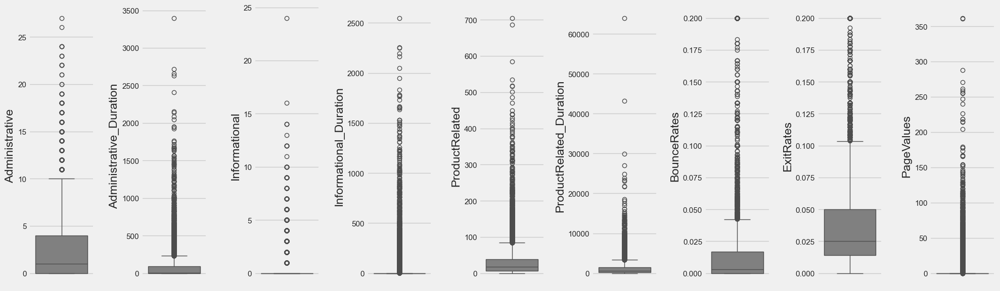

In [34]:
plt.figure(figsize=(20,6))
for i in range(0, len(num)):
    plt.subplot(1, len(num), i+1)
    sns.boxplot(y=df[num[i]], color='grey', orient='v')
    plt.tight_layout()

Distribusi data dari feature-feature numerikal cenderung memiliki oulier (long-tailed). 
1. Outlier yang  memiliki nilai yang sangat jauh yaitu : Administrative_Duration, Informational_Duration, ProductRelated, ProductRelated_Duration, PageValues 

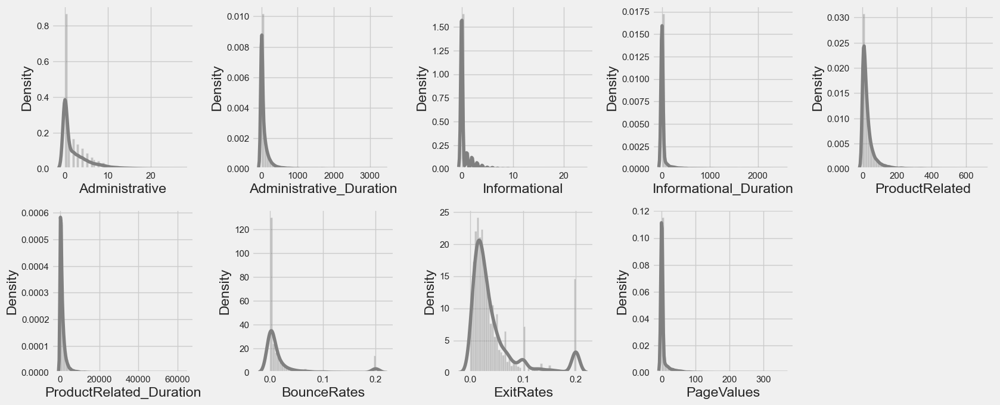

In [37]:
# cek distribusi menggunakan distplot:
plt.figure(figsize=(17, 10))
for i in range(0, len(num)):
    plt.subplot(3, 5, i+1)
    sns.distplot(df[num[i]], color = 'grey')
    plt.tight_layout()
plt.show()

Distrubusi data dari feature numerikal cenderung positif-skewed, dan distribusi data mendekati nolai 0. 

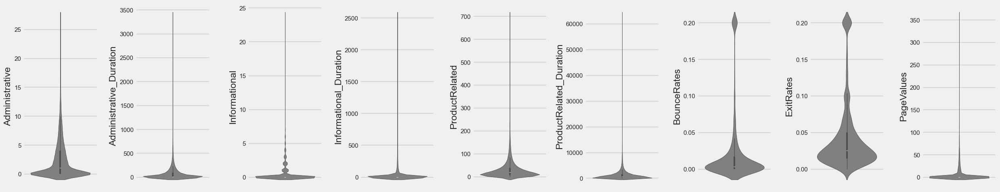

In [40]:
# #violin plot untuk tahu distribus + outlier 
plt.figure(figsize=(25, 5))
for i in range (0, len(num)):
    plt.subplot(1, len(num), i+1)
    sns.violinplot(y=df[num[i]], color='grey', orient='v')
    plt.tight_layout()

Distribusi data cenderung menumpuk ekstrim di nilai 0, yaitu : administrative, administrative_Duration, Informational, Informational_Duration, productrelated, productrelated_duration, pagevalues

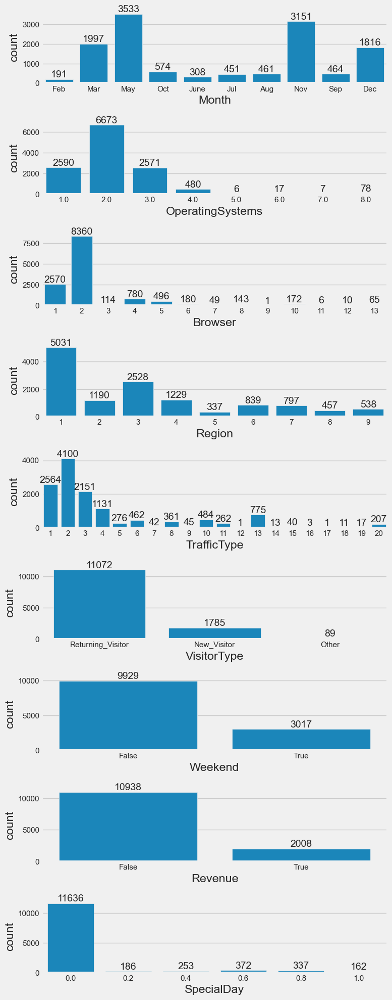

In [43]:
import math

plt.figure(figsize=(8, 20))

for i in range(0, len(cat)):
    plt.subplot(math.ceil(len(cat)/1), 1, i+1)
    plot = sns.countplot(data=df, x=cat[i])
    
    # Menambahkan anotasi angka di atas setiap bar
    for p in plot.patches:
        height = p.get_height()
        plot.text(p.get_x() + p.get_width() / 2., height + 0.1, f'{height:.0f}', ha="center", va="bottom")


plt.tight_layout()
plt.show()

1. Pengunjung web tertinggi pada bulan Mei dan November, namun pembelian banyak di bulan november
2. Mayoritas pengunjung dari kategori returning_visitor
3. Lebih banyak kunjungan di weekdays
4. Pengunjung sebanyak 10398 tidak melakukan pembelian. 

### Multivariate Analysis

#### Hubungan kolom numerikal

In [48]:
df['Rev'] = df['Revenue'].astype(float).astype(int)
df_rev = df.copy()
df_rev.sample(5)

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,Rev
4923,2.0,47.666667,0,0.000000,83,3025.283333,0.000000,0.006504,28.941805,0.2,May,2.0,2,7,3,Returning_Visitor,False,False,0
7515,7.0,236.400000,0,0.000000,14,341.700000,0.059649,0.084211,0.000000,0.0,June,3.0,2,4,3,Returning_Visitor,False,False,0
11871,NaN,524.950000,2,248.333333,133,5948.998311,0.005957,0.008290,0.000000,0.0,Dec,1.0,1,1,10,Returning_Visitor,False,False,0
7835,3.0,94.600000,0,0.000000,17,265.500000,0.000000,0.000000,0.000000,0.0,Oct,2.0,2,1,2,New_Visitor,False,False,0
12103,12.0,275.516667,2,288.375000,60,1276.594048,0.000000,0.009524,5.452433,0.0,Nov,4.0,1,1,2,Returning_Visitor,False,True,1


In [50]:
nums = ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues', 'Rev']
cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'SpecialDay', 'OperatingSystems','Browser', 'Region', 'TrafficType']

<Axes: >

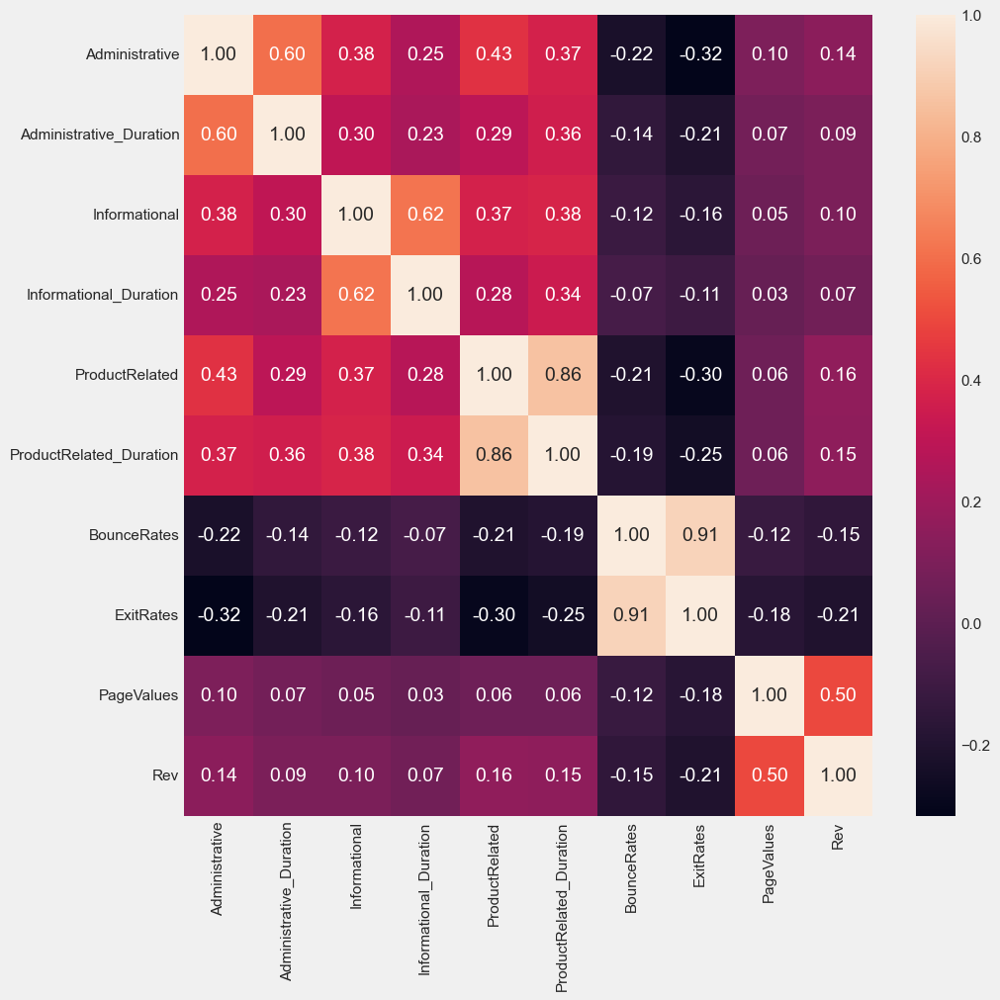

In [52]:
# analisi menggunakan heatmap
plt.figure(figsize=(10,10))
sns.heatmap(df_rev[nums].corr(), annot=True, fmt='.2f')

1.  Terdapat nilai **multikolinieritas** yang tinggi (> 0.7) antara fitur ExitRates-BounceRates, sehingga dapat di drop salah satunya
2.  Terdapat fitur-fitur yang kemungkinan bernilai **redundan** karena nilai korelasi cukup tinggi seperti administrative - administrative_duration, info-info_duration, productrelate-product_duration, bouncerate-exitrate, sehingga dapat di drop salah satunya
3.  Page Values memiliki nilai korelasi tinggi yaitu 0.50 dengan fitur revenue sebagai target

In [55]:
numerical = ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues', 'Rev']
categorical = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']

In [57]:
type_cat = df[categorical]
type_cat

def cramers_V(var1, var2):
    crosstab = np.array(pd.crosstab(var1, var2, rownames = None, colnames = None))
    stat = chi2_contingency(crosstab)[0]
    obs = np.sum(crosstab)
    mini = min(crosstab.shape)-1
    return (np.sqrt(stat/(obs*mini)))

In [59]:
from scipy.stats import chi2_contingency
rows = []
for var1 in type_cat:
    col = []
    for var2 in type_cat:
        cramers = cramers_V(type_cat[var1], type_cat[var2])
        col.append(round(cramers,2))
    rows.append(col)

cramers_result = np.array(rows)
tabel_corelation_categorical = pd.DataFrame(cramers_result, columns = type_cat.columns, index = type_cat.columns)
tabel_corelation_categorical



,Month,VisitorType,Weekend,Revenue,OperatingSystems,Browser,Region,TrafficType,SpecialDay
Month,1.00,0.14,0.06,0.18,0.06,0.07,0.05,0.20,0.24
VisitorType,0.14,1.00,0.05,0.10,0.47,0.51,0.18,0.39,0.07
Weekend,0.06,0.05,1.00,0.03,0.12,0.09,0.03,0.15,0.26
Revenue,0.18,0.10,0.03,1.00,0.08,0.05,0.03,0.17,0.09
OperatingSystems,0.06,0.47,0.12,0.08,1.00,0.60,0.12,0.20,0.03
Browser,0.07,0.51,0.09,0.05,0.60,1.00,0.13,0.19,0.03
Region,0.05,0.18,0.03,0.03,0.12,0.13,1.00,0.09,0.03
TrafficType,0.20,0.39,0.15,0.17,0.20,0.19,0.09,1.00,0.12
SpecialDay,0.24,0.07,0.26,0.09,0.03,0.03,0.03,0.12,1.00


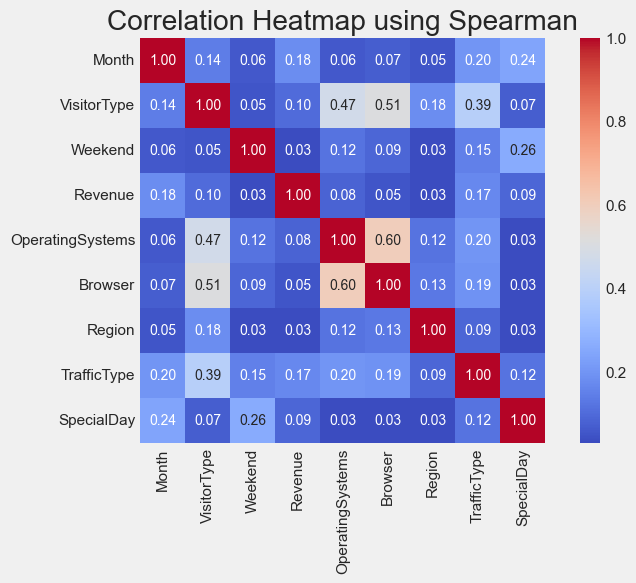

In [61]:
plt.figure(figsize=(8, 5))
sns.heatmap(tabel_corelation_categorical, cmap='coolwarm', annot=True, fmt='.2f', annot_kws={"size": 10}, square=True)
plt.title("Correlation Heatmap using Spearman")
plt.show()

1. visitor type - operatingsystem, visitor type- browser, visitor type - traffic type memiliki korelasi yang cukup tinggi
2. operatingsystem - browser memiliki korelasi yang tinggi 
3. fitur-fitur yang lain memiliki korelasi yang cukup rendah

<Figure size 1000x800 with 0 Axes>

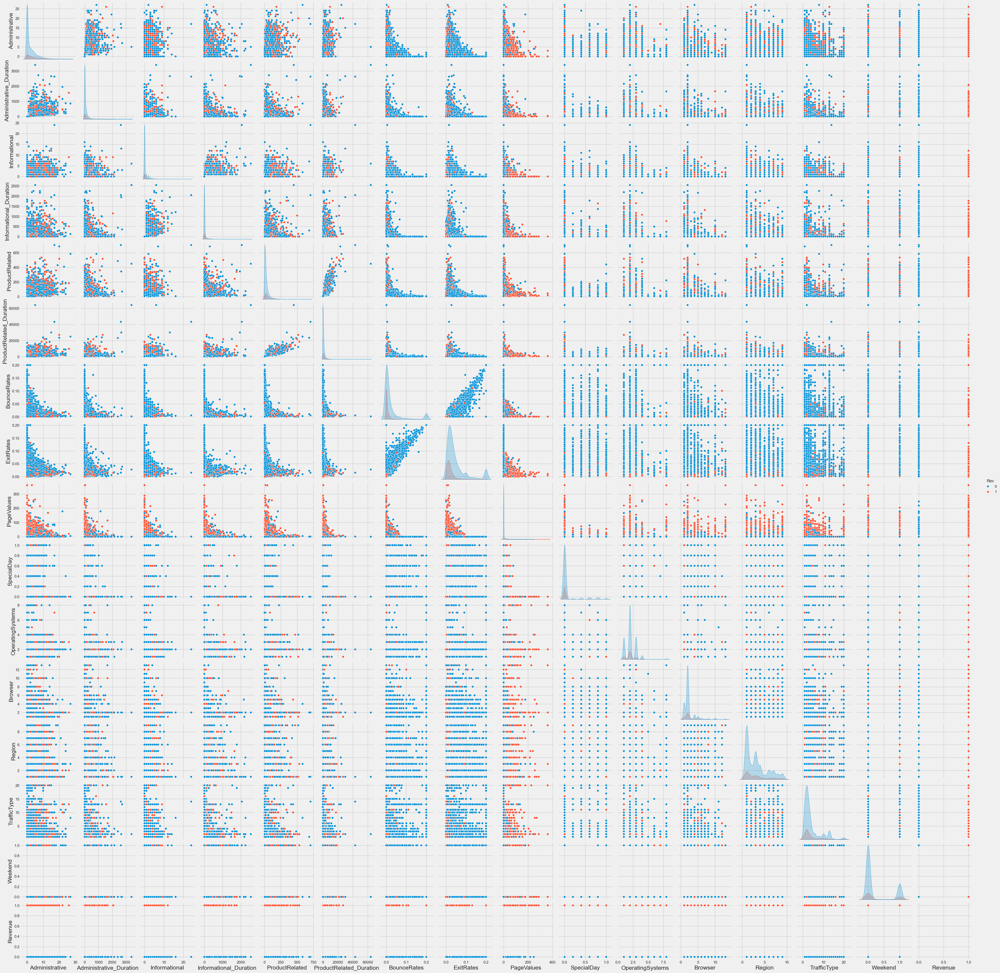

In [64]:
plt.figure(figsize=(10, 8))
sns.pairplot(df_rev, diag_kind='kde', hue='Rev')

#### Hubungan kolom numerik dengan kategorikal

ValueError: num must be an integer with 1 <= num <= 9, not 10

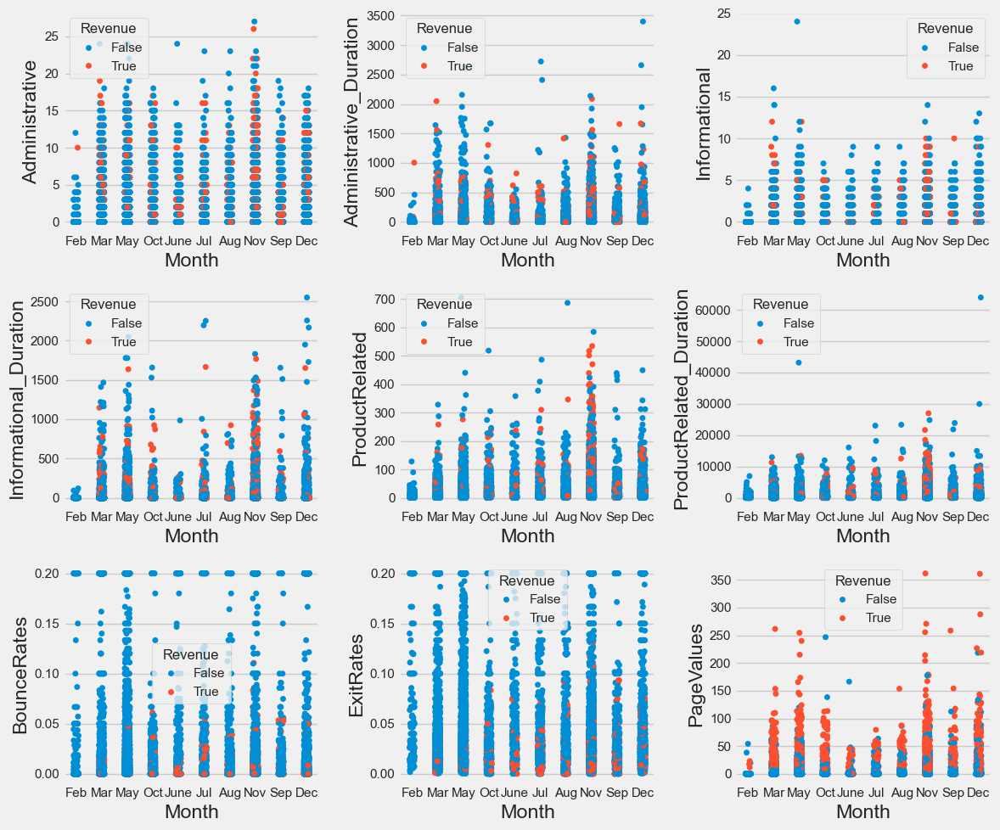

In [67]:
#cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']
    
fig = plt.figure(figsize=(12, 10))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(3, 3, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='Month', y=nums[i], hue = 'Revenue') # gambar catplot/stripplotnya
    plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 9, not 10

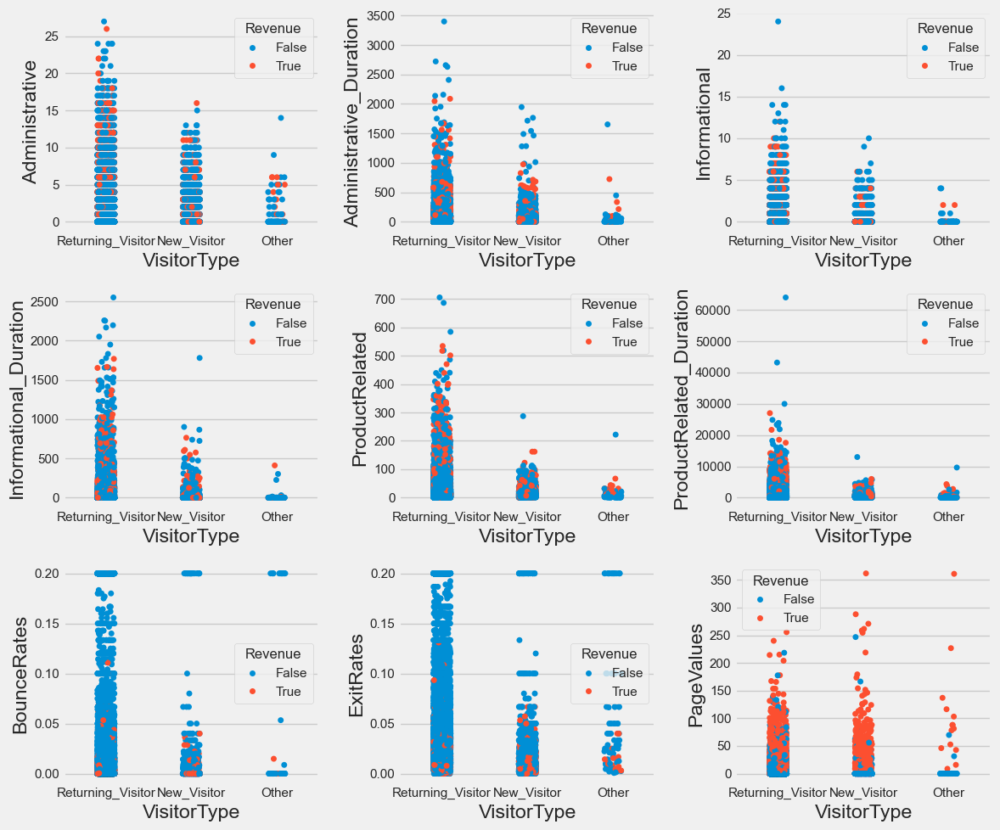

In [69]:
#cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']
    
fig = plt.figure(figsize=(12, 10))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(3, 3, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='VisitorType', y=nums[i], hue = 'Revenue') # gambar catplot/stripplotnya
    plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 9, not 10

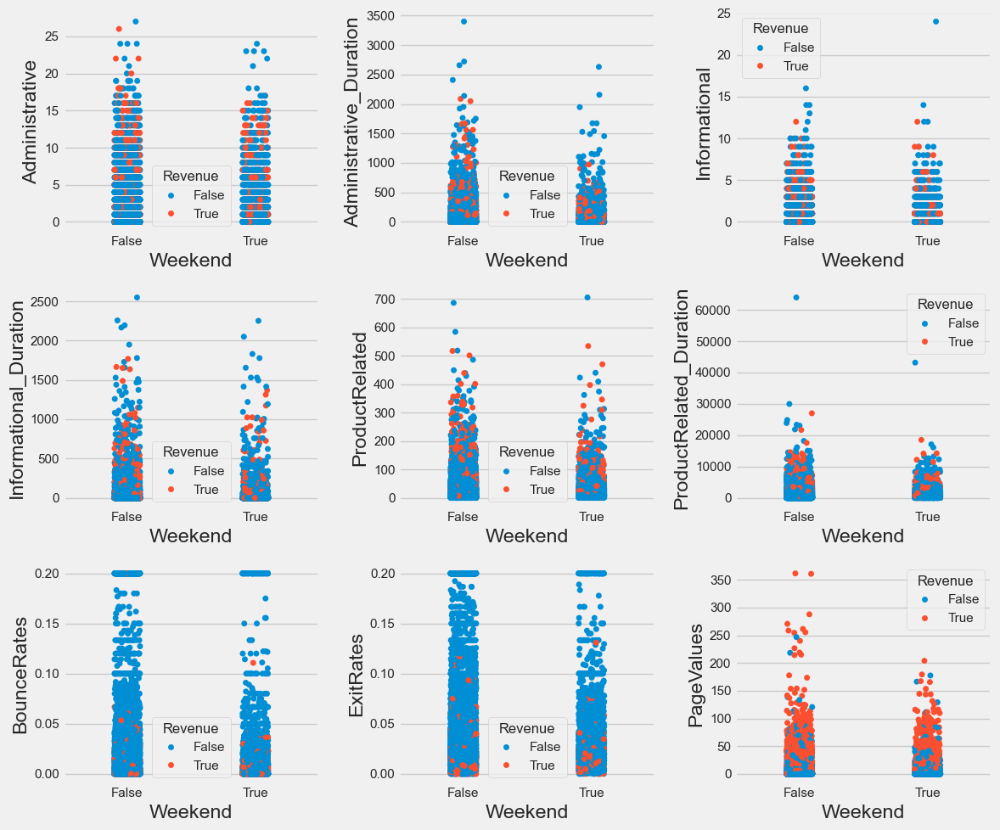

In [71]:
#cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']
    
fig = plt.figure(figsize=(12, 10))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(3, 3, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='Weekend', y=nums[i], hue = 'Revenue') # gambar catplot/stripplotnya
    plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 9, not 10

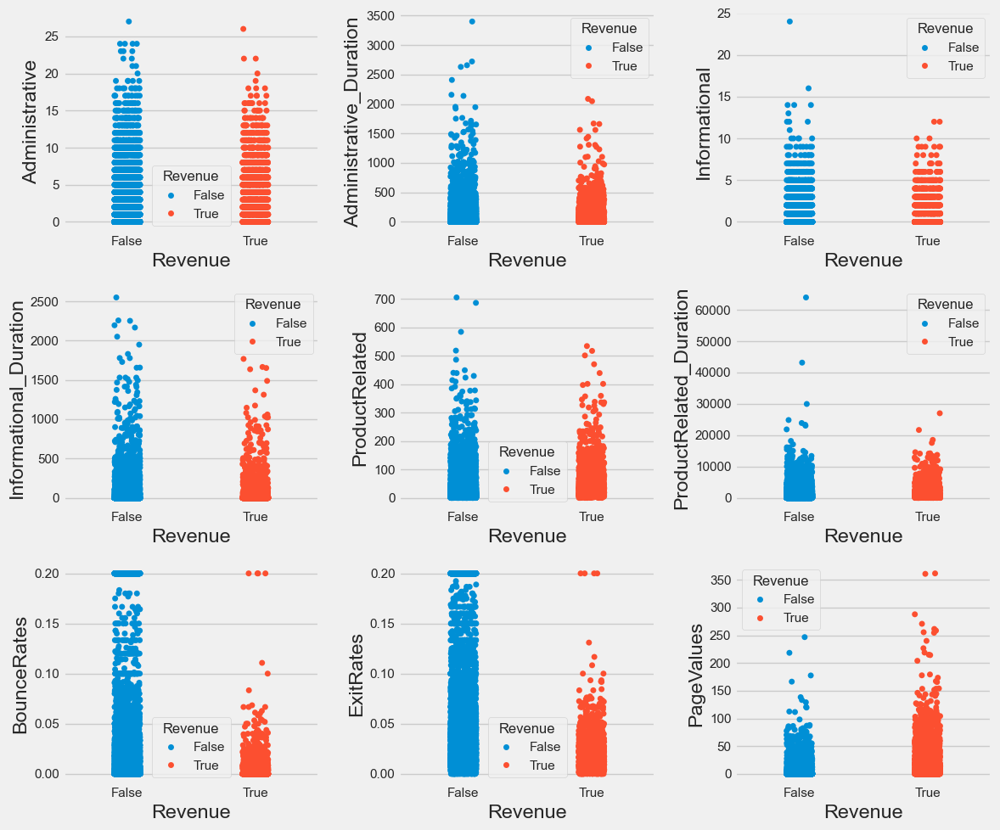

In [73]:
#cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']
    
fig = plt.figure(figsize=(12, 10))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(3, 3, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='Revenue', y=nums[i], hue = 'Revenue') # gambar catplot/stripplotnya
    plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 9, not 10

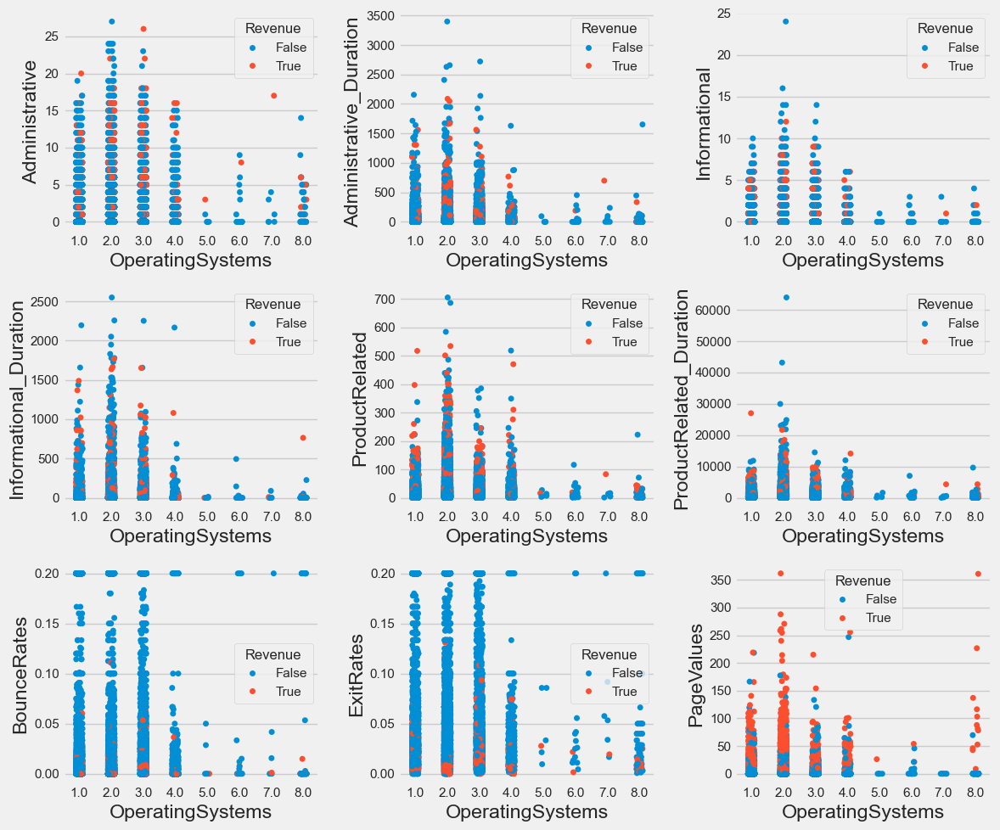

In [75]:
#cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']
    
fig = plt.figure(figsize=(12, 10))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(3, 3, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='OperatingSystems', y=nums[i], hue = 'Revenue') # gambar catplot/stripplotnya
    plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 9, not 10

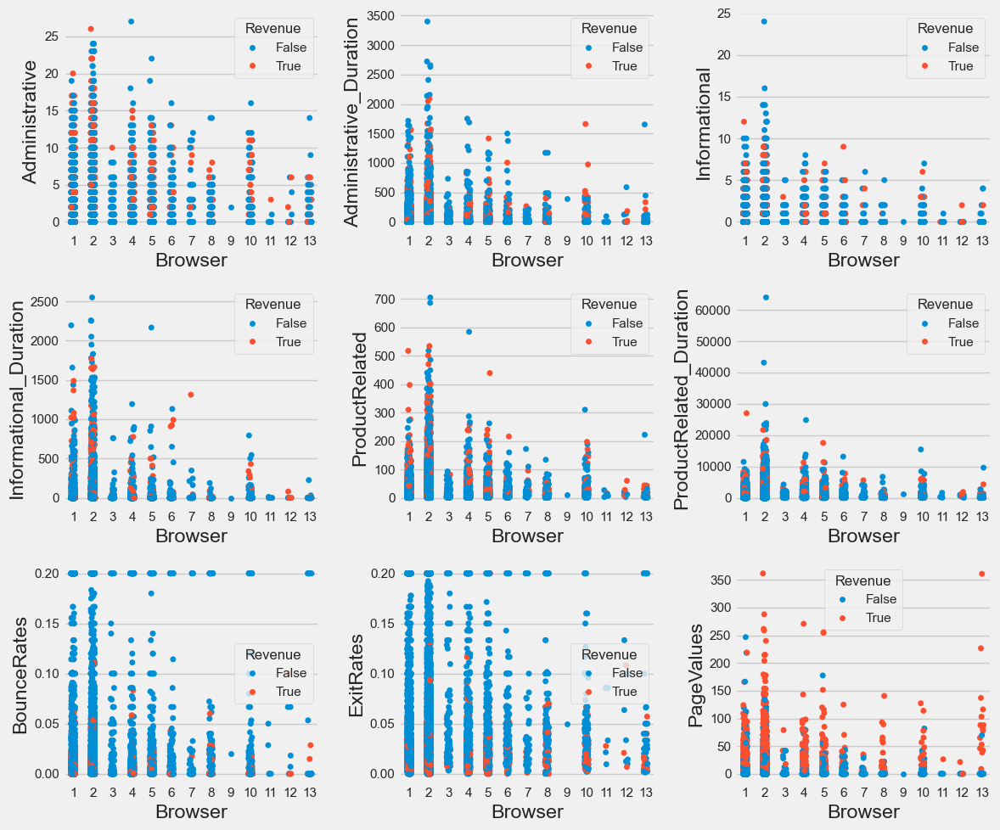

In [77]:
#cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']
    
fig = plt.figure(figsize=(12, 10))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(3, 3, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='Browser', y=nums[i], hue = 'Revenue') # gambar catplot/stripplotnya
    plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 9, not 10

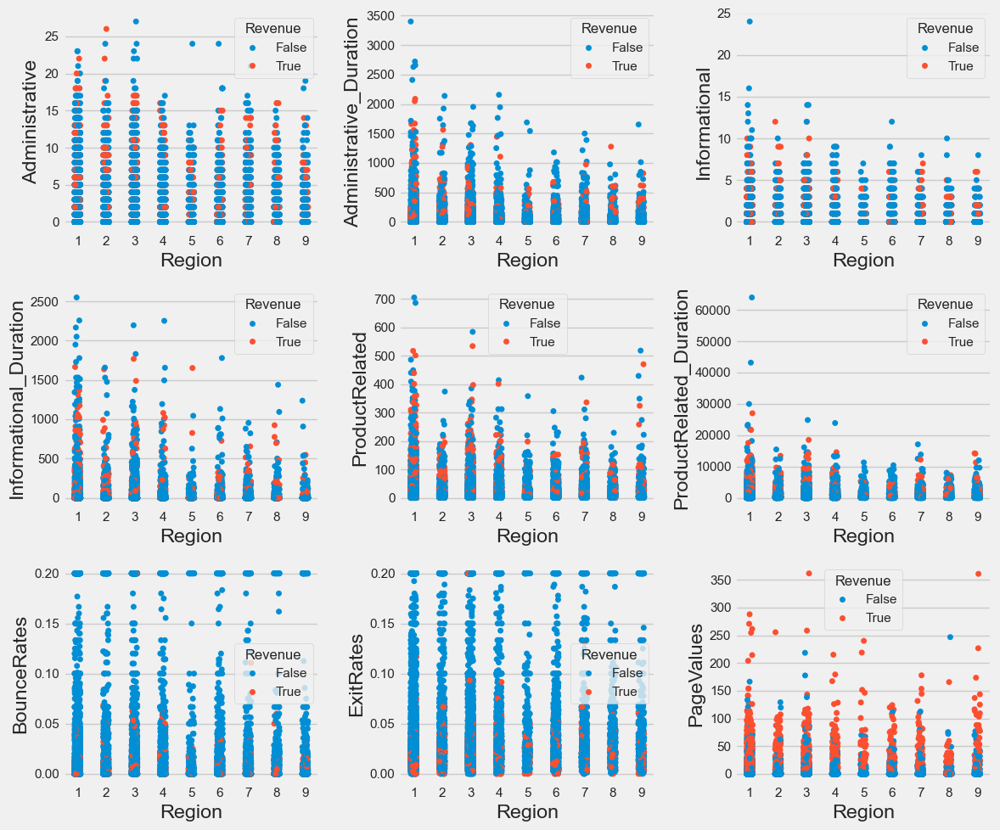

In [79]:
#cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']
    
fig = plt.figure(figsize=(12, 10))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(3, 3, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='Region', y=nums[i], hue = 'Revenue') # gambar catplot/stripplotnya
    plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 9, not 10

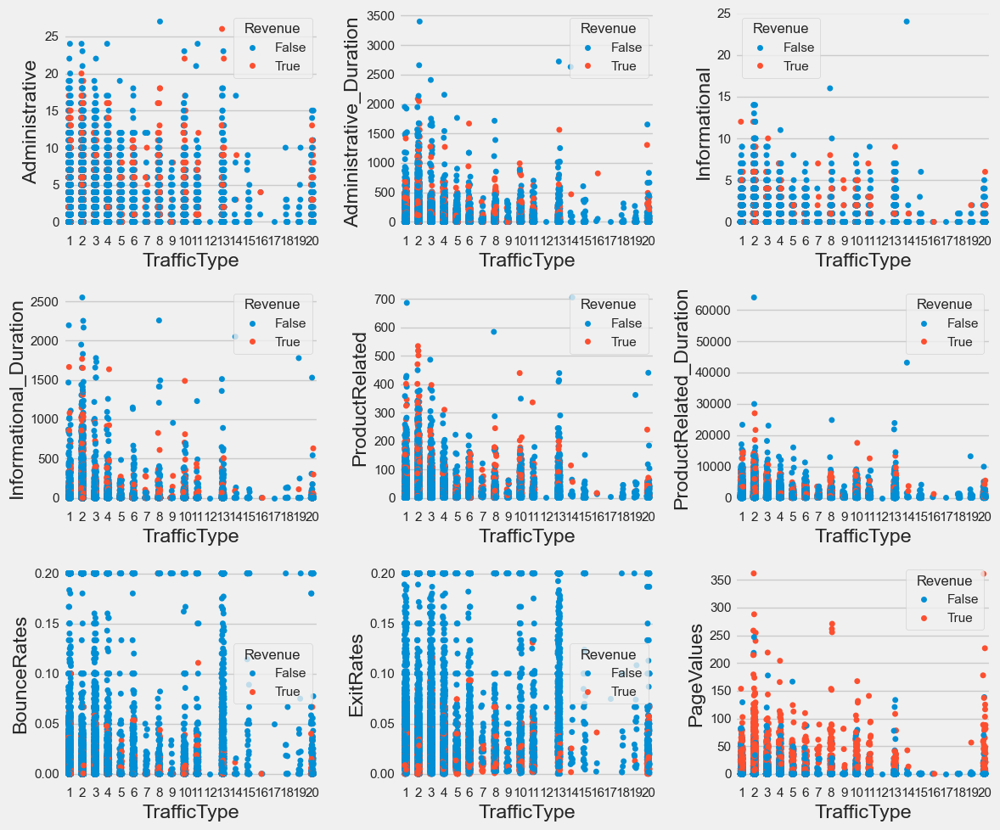

In [81]:
#cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']
    
fig = plt.figure(figsize=(12, 10))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(3, 3, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='TrafficType', y=nums[i], hue = 'Revenue') # gambar catplot/stripplotnya
    plt.tight_layout()

ValueError: num must be an integer with 1 <= num <= 9, not 10

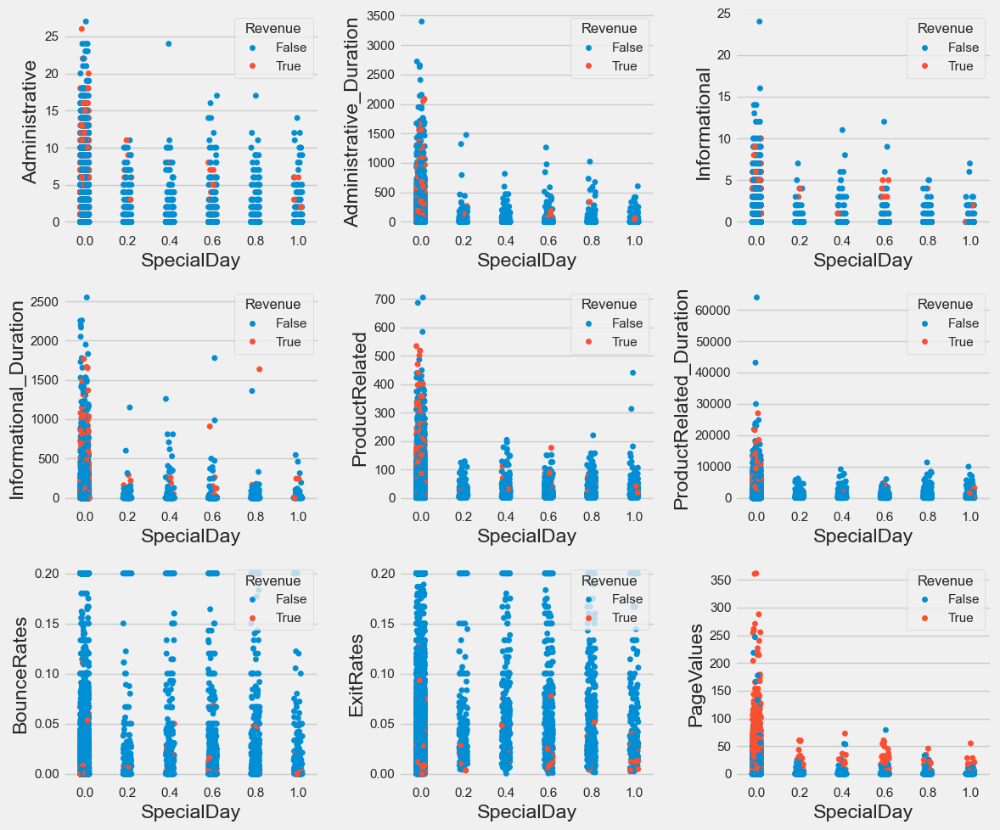

In [83]:
#cats = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType', 'SpecialDay']
    
fig = plt.figure(figsize=(12, 10))
for i in range(0, len(nums)): # untuk setiap kolom numerik
    ax = fig.add_subplot(3, 3, i+1) # kita set posisi catplot/stripplotnya di layout
    sns.stripplot(ax=ax, data=df, x='SpecialDay', y=nums[i], hue = 'Revenue') # gambar catplot/stripplotnya
    plt.tight_layout()

#### Bi - Variate 

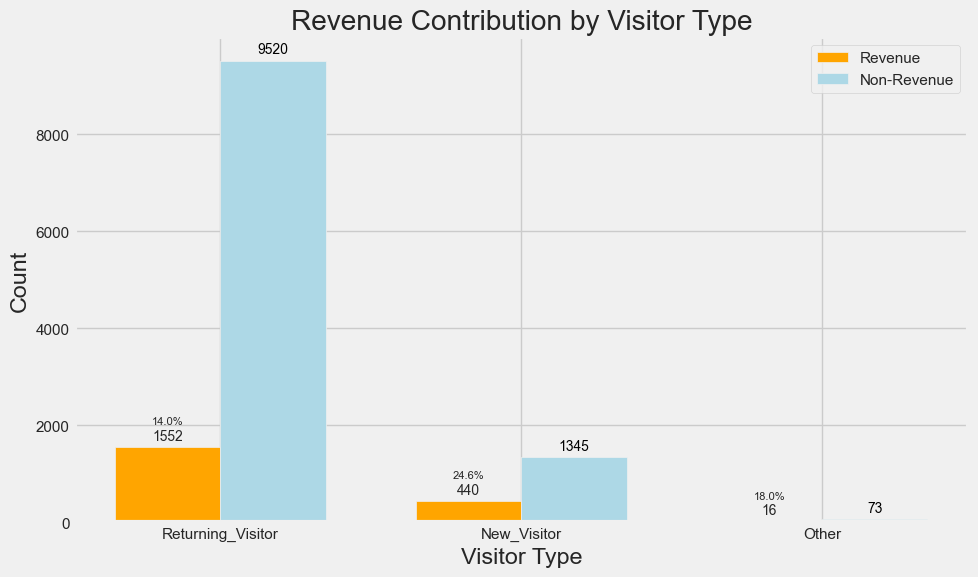

In [86]:
import matplotlib.pyplot as plt
import numpy as np

#get unique visitor types
visitor_types = df['VisitorType'].unique()

# Initialize figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Initialize index for x-axis
index = np.arange(len(visitor_types))
bar_width = 0.35

# Initialize counts and percentages
revenue_counts = []
non_revenue_counts = []

# Iterate over each visitor type
for visitor_type in visitor_types:
    # Subset data for current visitor type
    subset_data = df[df['VisitorType'] == visitor_type]
    
    # Count revenue and non-revenue visitors
    revenue_count = subset_data[subset_data['Revenue'] == True].shape[0]
    non_revenue_count = subset_data[subset_data['Revenue'] == False].shape[0]
    
    # Append counts to lists
    revenue_counts.append(revenue_count)
    non_revenue_counts.append(non_revenue_count)

# Calculate total counts for each visitor type
total_counts = np.array(revenue_counts) + np.array(non_revenue_counts)

# Calculate percentage contribution for revenue
percentage_revenue = np.array(revenue_counts) / total_counts * 100

# Plot grouped bar chart
bar1 = ax.bar(index, revenue_counts, bar_width, label='Revenue', color='orange')
bar2 = ax.bar(index + bar_width, non_revenue_counts, bar_width, label='Non-Revenue', color='lightblue')

# Add labels, title, and legend
ax.set_xlabel('Visitor Type')
ax.set_ylabel('Count')
ax.set_title('Revenue Contribution by Visitor Type')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(visitor_types)
ax.legend()

# Function to display counts and percentages on top of bars
def autolabel(bars, counts, percentages):
    for bar, count, percent in zip(bars, counts, percentages):
        height = bar.get_height()
        ax.annotate(f'{int(height)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10)  # smaller font size for count
        ax.annotate(f'{percent:.1f}%', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 15), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)  # smaller font size for percentage

# Call autolabel for revenue=True bars
autolabel(bar1, revenue_counts, percentage_revenue)

# Function to add count annotation on top of non-revenue bars
def autolabel_non_revenue(bars, counts):
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax.annotate(f'{int(height)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10, color='black')  # black color for count

# Call autolabel_non_revenue for revenue=False bars
autolabel_non_revenue(bar2, non_revenue_counts)

plt.tight_layout()
plt.show()

Terdapat tiga jenis visitor :
1. Jumlah "Returning visitor" paling banyak namun persentase pengunjung yang menghasilkan revenue paling sedikit dibanding dari kedua jenis lainnya. 
2. Pengunjung "New Visitor" memiliki persentase pendapatan yang lebih tinggi dibandingkan dengan pengunjung kembali, dengan 24.65% dari mereka yang menghasilkan pendapatan.
3. Pengunjung "Other" memiliki persentase pendapatan sebesar 17.98%, lebih rendah dari pengunjung baru tetapi lebih tinggi dari pengunjung kembali.

In [89]:
df_cal = df.copy()
val =['Other', 'New_Visitor', 'Returning_Visitor']
df_cal['VisitorType'] = pd.Categorical(df_cal['VisitorType'], categories = val)

df_m = df.copy()
val =['Feb', 'Mar', 'May', 'June', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
df_m['Month'] = pd.Categorical(df_cal['Month'], categories = val)

df_m = df_m.groupby(['Month', 'Revenue'])['Month'].count()
df_m = df_m.reset_index(name='count')
df_m['percentage'] =  (100 * df_m['count'] / df_m.groupby('Month')['count'].transform('sum')).round(2)

pvt = df_m.pivot_table(index='Month', columns='Revenue', values=['count', 'percentage'])
pvt

count        percentage       
Revenue   False  True       False  True 
Month                                   
Feb       188.0    3.0      98.43   1.57
Mar      1796.0  201.0      89.93  10.07
May      3154.0  379.0      89.27  10.73
June      275.0   33.0      89.29  10.71
Jul       381.0   70.0      84.48  15.52
Aug       382.0   79.0      82.86  17.14
Sep       371.0   93.0      79.96  20.04
Oct       455.0  119.0      79.27  20.73
Nov      2348.0  803.0      74.52  25.48
Dec      1588.0  228.0      87.44  12.56

Text(7.97, 2550, 'November memiliki total pengunjung tertinggi \ndengan tingkat konversi pendapatan bulanan tertinggi, \nmencapai 25%.')

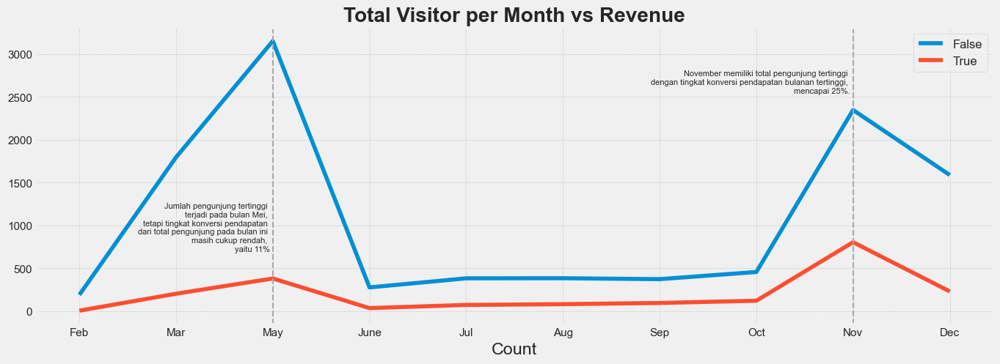

In [91]:
pvt_count = df_m.pivot_table(index='Month', columns='Revenue', values='count')

ax = pvt_count.plot(kind='line', figsize=(15,5))
plt.title('Total Visitor per Month vs Revenue', fontweight='bold')

# plt.xticks(rotation=360)
plt.xlabel('Count')
plt.legend(loc='lower right', fontsize=12)
plt.grid(color='darkgray', linestyle=':', linewidth=0.5)
plt.legend(loc='upper right', fontsize=12)

ax.set_xticks(np.arange(len(pvt_count))) #Show ticks for each country
ax.set_xticklabels(val) 

plt.axvline(x=2, color='darkgrey', ls='--', lw=1.5)
plt.axvline(x=8, color='darkgrey', ls='--', lw=1.5)

plt.text(1.97, 700, s='Jumlah pengunjung tertinggi \nterjadi pada bulan Mei, \ntetapi tingkat konversi pendapatan \ndari total pengunjung pada bulan ini \nmasih cukup rendah, \nyaitu 11%', 
         fontsize=8, ha = 'right')
plt.text(7.97, 2550, s='November memiliki total pengunjung tertinggi \ndengan tingkat konversi pendapatan bulanan tertinggi, \nmencapai 25%.', 
         fontsize=8, ha = 'right')

1. Bulan November juga memiliki jumlah pendapatan tertinggi (803) di antara semua bulan.
2. Bulan-bulan dengan jumlah pendapatan yang signifikan lainnya adalah Mei (379) dan Maret (201).
3. Februari memiliki jumlah pendapatan yang paling rendah (3), menunjukkan bahwa ini adalah bulan dengan performa paling rendah dalam hal pendapatan.

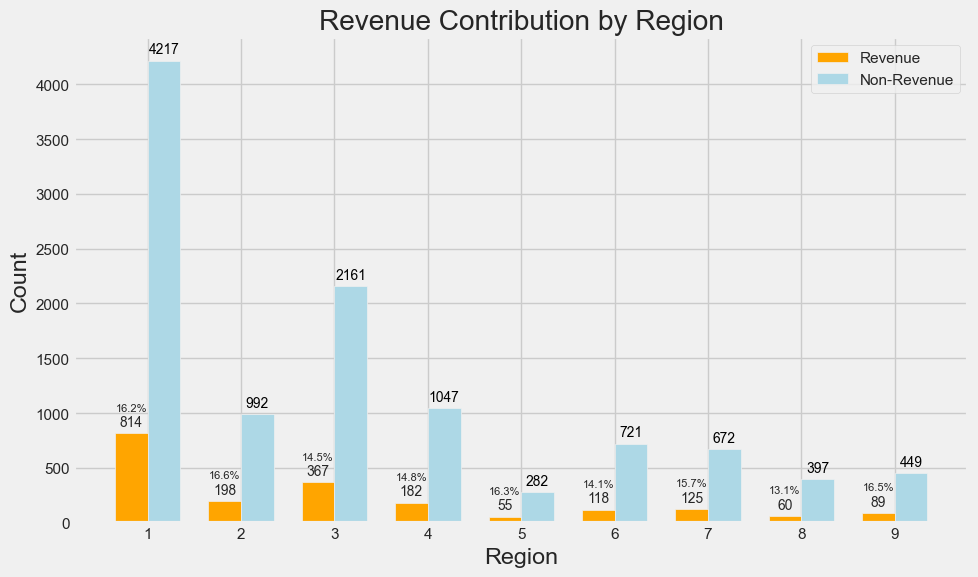

In [94]:

# Get unique region values and sort them numerically
region_values = np.sort(df['Region'].unique())

# Initialize counts and percentages
revenue_counts = []
non_revenue_counts = []

# Iterate over each region value
for region in region_values:
    # Subset data for current region value
    subset_data = df[df['Region'] == region]
    
    # Count revenue and non-revenue visitors
    revenue_count = subset_data[subset_data['Revenue'] == True].shape[0]
    non_revenue_count = subset_data[subset_data['Revenue'] == False].shape[0]
    
    # Append counts to lists
    revenue_counts.append(revenue_count)
    non_revenue_counts.append(non_revenue_count)

# Calculate total counts for each region value
total_counts = np.array(revenue_counts) + np.array(non_revenue_counts)

# Calculate percentage contribution for revenue
percentage_revenue = np.array(revenue_counts) / total_counts * 100

# Initialize figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Initialize index for x-axis
index = np.arange(len(region_values))
bar_width = 0.35

# Plot grouped bar chart
bar1 = ax.bar(index, revenue_counts, bar_width, label='Revenue', color='orange')
bar2 = ax.bar(index + bar_width, non_revenue_counts, bar_width, label='Non-Revenue', color='lightblue')

# Add labels, title, and legend
ax.set_xlabel('Region')
ax.set_ylabel('Count')
ax.set_title('Revenue Contribution by Region')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(region_values)
ax.legend()

# Function to display counts and percentages on top of bars
def autolabel(bars, counts, percentages):
    for bar, count, percent in zip(bars, counts, percentages):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10)  # smaller font size for count
        ax.annotate(f'{percent:.1f}%', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 15), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)  # smaller font size for percentage

# Call autolabel for revenue=True bars
autolabel(bar1, revenue_counts, percentage_revenue)

# Function to add count annotation on top of non-revenue bars
def autolabel_non_revenue(bars, counts):
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10, color='black')  # black color for count

# Call autolabel_non_revenue for revenue=False bars
autolabel_non_revenue(bar2, non_revenue_counts)

plt.tight_layout()
plt.show()

Wilayah 2 memiliki persentase pendapatan tertinggi (16.64%), diikuti oleh Wilayah 9 (16.54%), dan Wilayah 5 (16.32%)

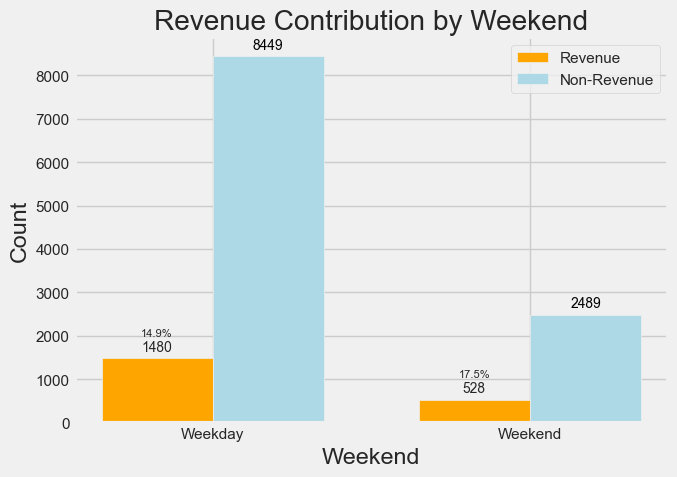

In [97]:
# Get unique weekend values
weekend_values = df['Weekend'].unique()

# Initialize figure and axes
fig, ax = plt.subplots(figsize=(7, 5))

# Initialize index for x-axis
index = np.arange(len(weekend_values))
bar_width = 0.35

# Initialize counts and percentages
revenue_counts = []
non_revenue_counts = []

# Iterate over each weekend value
for weekend in weekend_values:
    # Subset data for current weekend value
    subset_data = df[df['Weekend'] == weekend]
    
    # Count revenue and non-revenue visitors
    revenue_count = subset_data[subset_data['Revenue'] == True].shape[0]
    non_revenue_count = subset_data[subset_data['Revenue'] == False].shape[0]
    
    # Append counts to lists
    revenue_counts.append(revenue_count)
    non_revenue_counts.append(non_revenue_count)

# Calculate total counts for each weekend value
total_counts = np.array(revenue_counts) + np.array(non_revenue_counts)

# Calculate percentage contribution for revenue
percentage_revenue = np.array(revenue_counts) / total_counts * 100

# Plot grouped bar chart
bar1 = ax.bar(index, revenue_counts, bar_width, label='Revenue', color='orange')
bar2 = ax.bar(index + bar_width, non_revenue_counts, bar_width, label='Non-Revenue', color='lightblue')

# Add labels, title, and legend
ax.set_xlabel('Weekend')
ax.set_ylabel('Count')
ax.set_title('Revenue Contribution by Weekend')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(['Weekday', 'Weekend'])
ax.legend()

# Function to display counts and percentages on top of bars
def autolabel(bars, counts, percentages):
    for bar, count, percent in zip(bars, counts, percentages):
        height = bar.get_height()
        ax.annotate(f'{int(height)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10)  # smaller font size for count
        ax.annotate(f'{percent:.1f}%', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 15), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)  # smaller font size for percentage

# Call autolabel for revenue=True bars
autolabel(bar1, revenue_counts, percentage_revenue)

# Function to add count annotation on top of non-revenue bars
def autolabel_non_revenue(bars, counts):
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax.annotate(f'{int(height)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10, color='black')  # black color for count

# Call autolabel_non_revenue for revenue=False bars
autolabel_non_revenue(bar2, non_revenue_counts)

plt.tight_layout()
plt.show()

1. Persentase transaksi yang menghasilkan pendapatan lebih tinggi pada akhir pekan (17.50%) dibandingkan dengan hari biasa (14.91%).
2. Ini menunjukkan bahwa meskipun jumlah pengunjung lebih rendah pada akhir pekan, persentase transaksi yang menghasilkan pendapatan lebih tinggi.

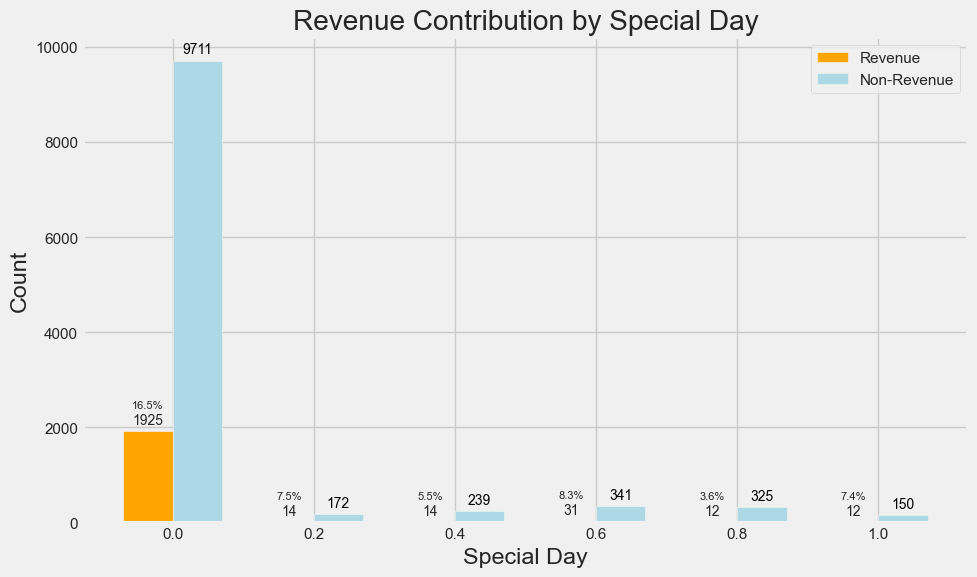

In [100]:
# Get unique special days and sort them
special_days = np.sort(df['SpecialDay'].unique())

# Initialize counts and percentages
revenue_counts = []
non_revenue_counts = []

# Iterate over each special day
for special_day in special_days:
    # Subset data for current special day
    subset_data = df[df['SpecialDay'] == special_day]
    
    # Count revenue and non-revenue visitors
    revenue_count = subset_data[subset_data['Revenue'] == True].shape[0]
    non_revenue_count = subset_data[subset_data['Revenue'] == False].shape[0]
    
    # Append counts to lists
    revenue_counts.append(revenue_count)
    non_revenue_counts.append(non_revenue_count)

# Calculate total counts for each special day
total_counts = np.array(revenue_counts) + np.array(non_revenue_counts)

# Calculate percentage contribution for revenue
percentage_revenue = np.array(revenue_counts) / total_counts * 100

# Initialize figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Initialize index for x-axis
index = np.arange(len(special_days))
bar_width = 0.35

# Plot grouped bar chart
bar1 = ax.bar(index, revenue_counts, bar_width, label='Revenue', color='orange')
bar2 = ax.bar(index + bar_width, non_revenue_counts, bar_width, label='Non-Revenue', color='lightblue')

# Add labels, title, and legend
ax.set_xlabel('Special Day')
ax.set_ylabel('Count')
ax.set_title('Revenue Contribution by Special Day')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(special_days)
ax.legend()

# Function to display counts and percentages on top of bars
def autolabel(bars, counts, percentages):
    for bar, count, percent in zip(bars, counts, percentages):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10)  # smaller font size for count
        ax.annotate(f'{percent:.1f}%', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 15), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)  # smaller font size for percentage

# Call autolabel for revenue=True bars
autolabel(bar1, revenue_counts, percentage_revenue)

# Function to add count annotation on top of non-revenue bars
def autolabel_non_revenue(bars, counts):
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10, color='black')  # black color for count

# Call autolabel_non_revenue for revenue=False bars
autolabel_non_revenue(bar2, non_revenue_counts)

plt.tight_layout()
plt.show()

Mayoritas transaksi (16.54%) terjadi pada hari yang tidak dianggap sebagai Hari Khusus (SpecialDay = 0.0).

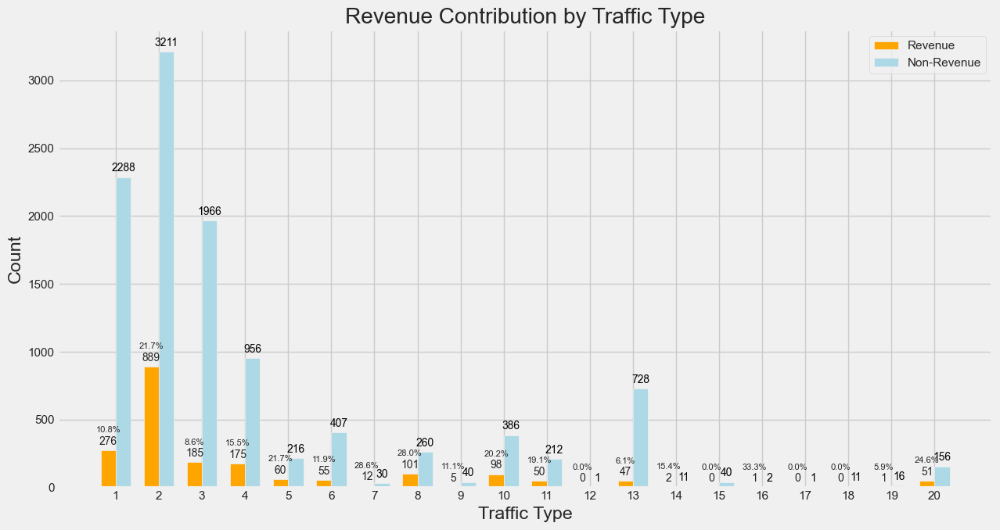

In [103]:
# Get unique traffic types and sort them
traffic_types = np.sort(df['TrafficType'].unique())

# Initialize counts and percentages
revenue_counts = []
non_revenue_counts = []

# Iterate over each traffic type
for traffic_type in traffic_types:
    # Subset data for current traffic type
    subset_data = df[df['TrafficType'] == traffic_type]
    
    # Count revenue and non-revenue visitors
    revenue_count = subset_data[subset_data['Revenue'] == True].shape[0]
    non_revenue_count = subset_data[subset_data['Revenue'] == False].shape[0]
    
    # Append counts to lists
    revenue_counts.append(revenue_count)
    non_revenue_counts.append(non_revenue_count)

# Calculate total counts for each traffic type
total_counts = np.array(revenue_counts) + np.array(non_revenue_counts)

# Calculate percentage contribution for revenue
percentage_revenue = np.array(revenue_counts) / total_counts * 100

# Initialize figure and axes
fig, ax = plt.subplots(figsize=(13, 7))

# Initialize index for x-axis
index = np.arange(len(traffic_types))
bar_width = 0.35

# Plot grouped bar chart
bar1 = ax.bar(index, revenue_counts, bar_width, label='Revenue', color='orange')
bar2 = ax.bar(index + bar_width, non_revenue_counts, bar_width, label='Non-Revenue', color='lightblue')

# Add labels, title, and legend
ax.set_xlabel('Traffic Type')
ax.set_ylabel('Count')
ax.set_title('Revenue Contribution by Traffic Type')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(traffic_types)
ax.legend()

# Function to display counts and percentages on top of bars
def autolabel(bars, counts, percentages):
    for bar, count, percent in zip(bars, counts, percentages):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10)  # smaller font size for count
        ax.annotate(f'{percent:.1f}%', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 15), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)  # smaller font size for percentage

# Call autolabel for revenue=True bars
autolabel(bar1, revenue_counts, percentage_revenue)

# Function to add count annotation on top of non-revenue bars
def autolabel_non_revenue(bars, counts):
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10, color='black')  # black color for count

# Call autolabel_non_revenue for revenue=False bars
autolabel_non_revenue(bar2, non_revenue_counts)

plt.tight_layout()
plt.show()

persentage dengan pendapatan yang tertinggi yaitu traffic type 16 (33.3%) dan count Traffic Type terbanyak yaitu Traffic Type 2 (889)

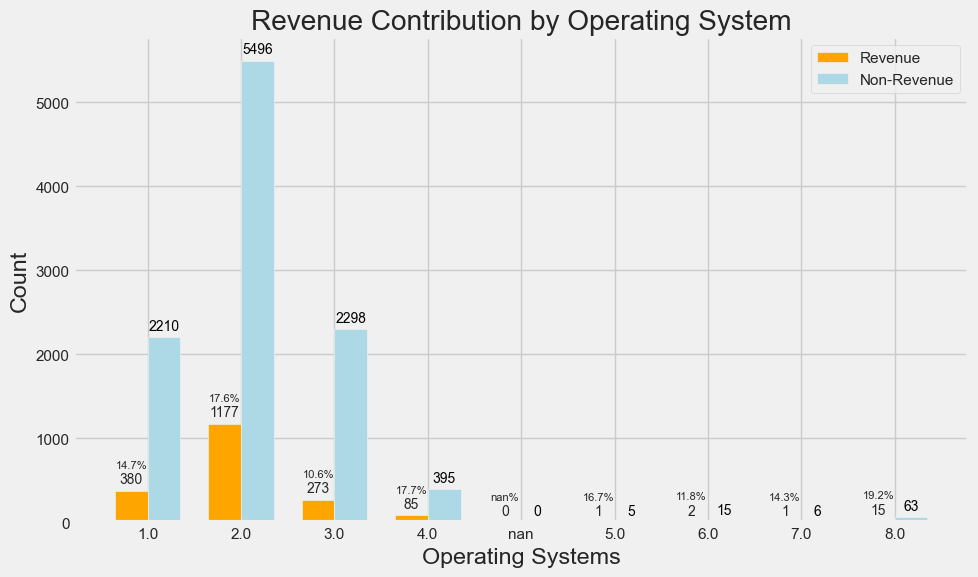

In [106]:
# Get unique operating system types and sort them
os_types = np.sort(df['OperatingSystems'].unique())

# Initialize counts and percentages
revenue_counts = []
non_revenue_counts = []

# Iterate over each operating system type
for os_type in os_types:
    # Subset data for current operating system type
    subset_data = df[df['OperatingSystems'] == os_type]
    
    # Count revenue and non-revenue visitors
    revenue_count = subset_data[subset_data['Revenue'] == True].shape[0]
    non_revenue_count = subset_data[subset_data['Revenue'] == False].shape[0]
    
    # Append counts to lists
    revenue_counts.append(revenue_count)
    non_revenue_counts.append(non_revenue_count)

# Calculate total counts for each operating system type
total_counts = np.array(revenue_counts) + np.array(non_revenue_counts)

# Calculate percentage contribution for revenue
percentage_revenue = np.array(revenue_counts) / total_counts * 100

# Initialize figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Initialize index for x-axis
index = np.arange(len(os_types))
bar_width = 0.35

# Plot grouped bar chart
bar1 = ax.bar(index, revenue_counts, bar_width, label='Revenue', color='orange')
bar2 = ax.bar(index + bar_width, non_revenue_counts, bar_width, label='Non-Revenue', color='lightblue')

# Add labels, title, and legend
ax.set_xlabel('Operating Systems')
ax.set_ylabel('Count')
ax.set_title('Revenue Contribution by Operating System')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(os_types)
ax.legend()

# Function to display counts and percentages on top of bars
def autolabel(bars, counts, percentages):
    for bar, count, percent in zip(bars, counts, percentages):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10)  # smaller font size for count
        ax.annotate(f'{percent:.1f}%', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 15), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)  # smaller font size for percentage

# Call autolabel for revenue=True bars
autolabel(bar1, revenue_counts, percentage_revenue)

# Function to add count annotation on top of non-revenue bars
def autolabel_non_revenue(bars, counts):
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10, color='black')  # black color for count

# Call autolabel_non_revenue for revenue=False bars
autolabel_non_revenue(bar2, non_revenue_counts)

plt.tight_layout()
plt.show()

1. Mayoritas pengunjung menggunakan operating system 2 dan percentase konversi tertinggi yaitu operating systems 8
2. Terdapat nilai nan pada fitur operating systems

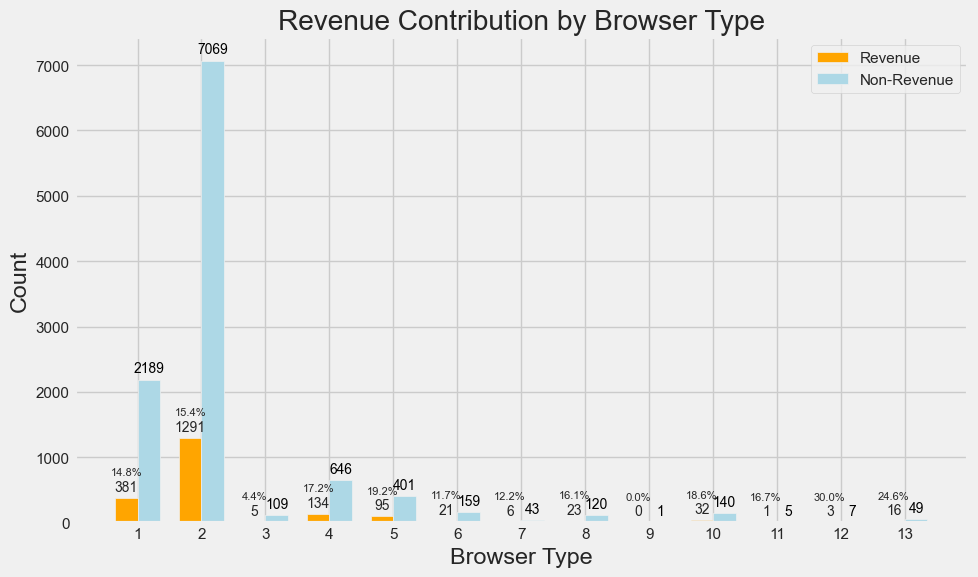

In [109]:
# Get unique browser types and sort them
browser_types = np.sort(df['Browser'].unique())

# Initialize counts and percentages
revenue_counts = []
non_revenue_counts = []

# Iterate over each browser type
for browser_type in browser_types:
    # Subset data for current browser type
    subset_data = df[df['Browser'] == browser_type]
    
    # Count revenue and non-revenue visitors
    revenue_count = subset_data[subset_data['Revenue'] == True].shape[0]
    non_revenue_count = subset_data[subset_data['Revenue'] == False].shape[0]
    
    # Append counts to lists
    revenue_counts.append(revenue_count)
    non_revenue_counts.append(non_revenue_count)

# Calculate total counts for each browser type
total_counts = np.array(revenue_counts) + np.array(non_revenue_counts)

# Calculate percentage contribution for revenue
percentage_revenue = np.array(revenue_counts) / total_counts * 100

# Initialize figure and axes
fig, ax = plt.subplots(figsize=(10, 6))

# Initialize index for x-axis
index = np.arange(len(browser_types))
bar_width = 0.35

# Plot grouped bar chart
bar1 = ax.bar(index, revenue_counts, bar_width, label='Revenue', color='orange')
bar2 = ax.bar(index + bar_width, non_revenue_counts, bar_width, label='Non-Revenue', color='lightblue')

# Add labels, title, and legend
ax.set_xlabel('Browser Type')
ax.set_ylabel('Count')
ax.set_title('Revenue Contribution by Browser Type')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(browser_types)
ax.legend()

# Function to display counts and percentages on top of bars
def autolabel(bars, counts, percentages):
    for bar, count, percent in zip(bars, counts, percentages):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10)  # smaller font size for count
        ax.annotate(f'{percent:.1f}%', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 15), textcoords='offset points',
                    ha='center', va='bottom', fontsize=8)  # smaller font size for percentage

# Call autolabel for revenue=True bars
autolabel(bar1, revenue_counts, percentage_revenue)

# Function to add count annotation on top of non-revenue bars
def autolabel_non_revenue(bars, counts):
    for bar, count in zip(bars, counts):
        height = bar.get_height()
        ax.annotate(f'{int(count)}', 
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3), textcoords='offset points',
                    ha='center', va='bottom', fontsize=10, color='black')  # black color for count

# Call autolabel_non_revenue for revenue=False bars
autolabel_non_revenue(bar2, non_revenue_counts)

plt.tight_layout()
plt.show()

Pengunjung mayoritas menggunakan browser 2 

In [112]:
nume = ['Administrative', 'Administrative_Duration', 'Informational', 'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration', 'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay']
cate = ['Month', 'VisitorType', 'Weekend', 'Revenue', 'OperatingSystems','Browser', 'Region', 'TrafficType']

In [114]:
df_new = df.copy()

In [116]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12946 entries, 0 to 12945
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12835 non-null  float64
 1   Administrative_Duration  12313 non-null  float64
 2   Informational            12946 non-null  int64  
 3   Informational_Duration   12946 non-null  float64
 4   ProductRelated           12946 non-null  int64  
 5   ProductRelated_Duration  12307 non-null  float64
 6   BounceRates              12872 non-null  float64
 7   ExitRates                12946 non-null  float64
 8   PageValues               12946 non-null  float64
 9   SpecialDay               12946 non-null  object 
 10  Month                    12946 non-null  object 
 11  OperatingSystems         12422 non-null  object 
 12  Browser                  12946 non-null  object 
 13  Region                   12946 non-null  object 
 14  TrafficType           

In [130]:
def highlight_greater_than_zero(s):
    return ['background-color: Red' if v > 0 else '' for v in s]

special_day_df = df[['Month','SpecialDay']].groupby(['Month']).agg('mean').reset_index()

# Apply the style to the DataFrame
styled_df = special_day_df.style.apply(highlight_greater_than_zero, subset=['SpecialDay'])
styled_df

,Month,SpecialDay
0,Aug,0.000000
1,Dec,0.000000
2,Feb,0.228272
3,Jul,0.000000
4,June,0.000000
5,Mar,0.000000
6,May,0.212171
7,Nov,0.000000
8,Oct,0.000000
9,Sep,0.000000


In [132]:
page_cnt_df = df.groupby('Revenue')[['Administrative', 'Informational', 'ProductRelated']].mean().reset_index()

# Chage values of Revenue column to be more readable data
page_cnt_df.loc[page_cnt_df['Revenue'] == True, 'Revenue'] = 'Buyers'
page_cnt_df.loc[page_cnt_df['Revenue'] == False, 'Revenue'] = 'Non-Buyers'
page_cnt_df

,Revenue,Administrative,Informational,ProductRelated
0,Non-Buyers,2.103486,0.447065,28.676632
1,Buyers,3.393879,0.780876,47.895916


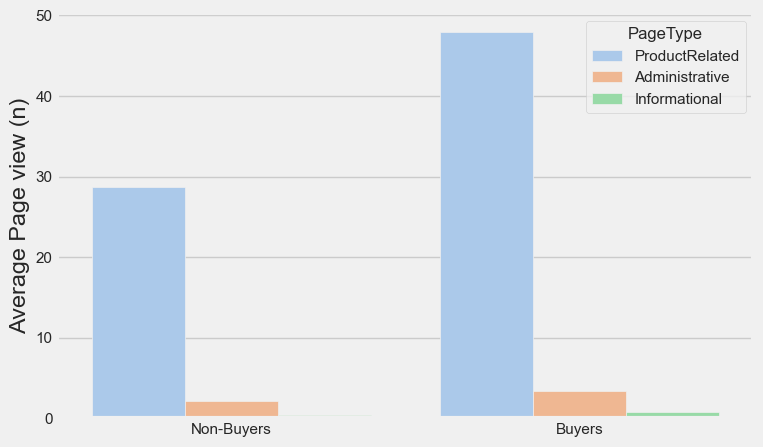

In [134]:
melted_df = page_cnt_df.melt(id_vars='Revenue', value_vars=[ 'ProductRelated', 'Administrative', 'Informational'],
                            var_name='PageType', value_name='Value')

plt.figure(figsize=(8, 5))
sns.barplot(data=melted_df, x='Revenue', y='Value', hue='PageType', palette='pastel')
plt.xlabel('')
plt.ylabel('Average Page view (n)')
plt.show()

## Insight

### Insight Data Desktitif : 

1. Jumlah pengunjung web tertinggi pada bulan Mei
2. Pelanggan mayoritas adalah Returning_Visitor sebanyak 85.5%
3. kunjungan pelanggan mayoritas diluar weekend 
4. Dari 12946 data, sebanyak 10938 atau 85.5% tidak melakukan pembelian sisanya 2008 atau 15.5% yang melakukan pembelian  
5. Sistem operaasi yang banyak digunakan oleh pengunjung yaitu sistem operasi 2
6. Browser yang banyak digunakan oleh pengunjung yaitu browser 2
7. Region pengunjung banyak berasal dari region 1
8. Traffic type pengunjung terbanyak yaitu traffic type 2

### Kesimpulan Data Deskritif :

1. Terdapat beberapa kolom dengan nilai null yang lebih dari 1-2% (Administrative_Duration, ProductRelated_Duration, OperatingSystems) handling missing value, dan yang <2% akan dilakukan drop data (Administrative, Administrative)
Semua kolom numerik skew (dilihat dari perbedaan antara mean > median)
2. Tidak ada kolom kategori yang perlu didrop karena hanya punya 1 nilai unik atau punya nilai unik sebanyak jumlah baris
3. Terdapat data duplicate sebanyak 711 baris



### Insight Univariate :

1. Distribusi data dari feature-feature numerikal cenderung memiliki oulier (long-tailed) <br>
Outlier yang memiliki nilai yang sangat jauh yaitu : Administrative_Duration, Informational_Duration, ProductRelated, ProductRelated_Duration, PageValues
2. Distrubusi data dari feature numerikal cenderung positif-skewed, dan distribusi data mendekati nolai 0
3. Distribusi data cenderung menumpuk ekstrim di nilai 0, yaitu : administrative, administrative_Duration, Informational, Informational_Duration, productrelated, productrelated_duration, pagevalues
4. Pengunjung web tertinggi pada bulan Mei dan November
5. Operating System yang banyak digunakan oleh pengunjung yaitu OS 2
6. Browser yang banyak digunakan yaitu browser 2
7. Visitor yang berkunjung berasal dari region 1
8. Pengunjung paling banyak datang melalui traffic type 2
9. Mayoritas pengunjung dari kategori returning_visitor
10. Lebih banyak kunjungan di weekdays
11. Pengunjung sebanyak 10398 tidak melakukan pembelian
12. Jumlah kunjungan paling banyak di luar Special Day

### Insight MultiVariate :
- Antar kolom numerikal
1. Terdapat nilai multikolinieritas yang tinggi (> 0.7) antara fitur ExitRates-BounceRates, sehingga dapat di drop salah satunya
2. Terdapat fitur-fitur yang kemungkinan bernilai redundan karena nilai korelasi cukup tinggi seperti administrative - administrative_duration, info-info_duration, productrelate-product_duration, bouncerate-exitrate, sehingga dapat di drop salah satunya
3. Page Values memiliki nilai korelasi tinggi yaitu 0.50 dengan fitur revenue sebagai target

- Antar kolom kategorikal
1. visitor type - operatingsystem, visitor type- browser, visitor type - traffic type memiliki korelasi yang cukup tinggi
2. operatingsystem - browser memiliki korelasi yang tinggi
3. fitur-fitur yang lain memiliki korelasi yang cukup rendah

### Insight Bi-Variate :
- Terdapat tiga jenis visitor :
1. Jumlah "Returning visitor" paling banyak namun persentase pengunjung yang menghasilkan revenue paling sedikit dibanding dari kedua jenis lainnya.
2. Pengunjung "New Visitor" memiliki persentase pendapatan yang lebih tinggi dibandingkan dengan pengunjung kembali, dengan 24.65% dari mereka yang menghasilkan pendapatan.
3. Pengunjung "Other" memiliki persentase pendapatan sebesar 17.98%, lebih rendah dari pengunjung baru tetapi lebih tinggi dari pengunjung kembali.
<br>
- Total Visitor per Month Vs Revenue :
1. Bulan November juga memiliki jumlah pendapatan tertinggi (803) di antara semua bulan.
2. Bulan-bulan dengan jumlah pendapatan yang signifikan lainnya adalah Mei (379) dan Maret (201).
3. Februari memiliki jumlah pendapatan yang paling rendah (3), menunjukkan bahwa ini adalah bulan dengan performa paling rendah dalam hal pendapatan.
<br>
- Visitor per Region Vs Revenue :
1. Wilayah 2 memiliki persentase pendapatan tertinggi (16.64%), diikuti oleh Wilayah 9 (16.54%), dan Wilayah 5 (16.32%)
<br>
- Weekend Vs Revenue
1. Persentase transaksi yang menghasilkan pendapatan lebih tinggi pada akhir pekan (17.50%) dibandingkan dengan hari biasa (14.91%).
2. Ini menunjukkan bahwa meskipun jumlah pengunjung lebih rendah pada akhir pekan, persentase transaksi yang menghasilkan pendapatan lebih tinggi.
<br>
- Special Day Vs Revenue :
1. Mayoritas transaksi (16.54%) terjadi pada hari yang tidak dianggap sebagai Hari Khusus (SpecialDay = 0.0).
<br>
- Traffic Type Vs Revenue 
1. persentage dengan pendapatan yang tertinggi yaitu traffic type 16 (33.3%) dan count Traffic Type terbanyak yaitu Traffic Type 2 (889)
<br>
- Operating Systems Vs Revenue :
1. Mayoritas pengunjung menggunakan operating system 2 dan percentase konversi tertinggi yaitu operating systems 8
<br>
- Browser Vs Revenue : 
1. Pengunjung mayoritas menggunakan browser 2 
<br>
- Special Day per Month :
1. Special Day banyak di bulan February dan May
<br>
- ProductRelated, Administrative, informational Vs Revenue :
1. Interaksi dengan halaman terkait produk (Product Related) merupakan faktor penting dalam mendorong pembelian.

## Bisnis Rekomendasi : 
1. Fokus pada Pengunjung Baru (New Visitor): Meskipun jumlah pengunjung yang kembali (Returning Visitor) mungkin lebih banyak,<br> 
namun persentase pendapatan yang dihasilkan oleh pengunjung baru (New Visitor) lebih tinggi. <br>
Oleh karena itu, proporsi strategi pemasaran dapat dilakukan untuk new visitor lebih besar dibandingkan dengan returning visitor dan tetap memperhatikan pengalaman pengunjung baru untuk meningkatkan konversi.

2. Berdasarkan data pendapatan bulanan, rekomendasi bisnis yang dapat diberikan adalah meningkatkan strategi pemasaran dan promosi selama bulan-bulan dengan performa tinggi seperti November, Mei, dan Maret. Fokus pada memanfaatkan momentum penjualan yang kuat pada bulan-bulan ini dapat membantu meningkatkan pendapatan secara keseluruhan. Sebaliknya, bulan Februari memerlukan evaluasi lebih lanjut untuk memahami faktor-faktor yang mengakibatkan performa pendapatan yang rendah, mungkin dengan memperkuat strategi promosi untuk menggerakkan penjualan di periode ini. 

3. Perhatikan Hari Khusus (Special Day): Meskipun mayoritas transaksi terjadi pada hari biasa, penting untuk tetap memperhatikan hari khusus (Special Day), terutama pada bulan Februari dan Mei, di mana ada banyak hari khusus. Ini bisa menjadi peluang untuk menawarkan penawaran khusus atau promosi untuk menarik lebih banyak konversi.

4. Fokus pada Optimalisasi Halaman Terkait Produk: Karena rata-rata kunjungan halaman terkait produk lebih tinggi untuk pembeli, bisnis harus memastikan halaman ini dioptimalkan dengan baik. Hal ini termasuk memastikan kecepatan halaman yang cepat, desain yang menarik, dan informasi yang relevan serta jelas.

5. Eksplorasi Potensi Akhir Pekan (Weekend): Meskipun jumlah pengunjung mungkin lebih rendah pada akhir pekan, persentase transaksi yang menghasilkan pendapatan lebih tinggi. Ini menunjukkan bahwa ada potensi yang belum dimanfaatkan pada akhir pekan, dan bisnis dapat mempertimbangkan untuk mengembangkan strategi pemasaran atau promosi khusus untuk menarik lebih banyak konversi selama periode ini.

6. Region 1, 3, dan 2 memiliki jumlah total dan jumlah pendapatan tertinggi. Alokasikan lebih banyak sumber daya seperti kampanye pemasaran, promosi yang dipersonalisasi, dan dukungan pelanggan ke region tersebut untuk memanfaatkan potensi pendapatan yang lebih tinggi.

7. Traffic type 2 memiliki jumlah pengunjung terbanyak tetapi konversinya rendah sehingga perlu mengalokasikan sumberdaya untuk meningkatkan konversi salah satu contohnya seperti promosi/diskon.